In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
import random
import numpy as np
import torch as tc
import torchvision as tv
import pandas as pd
import matplotlib.pyplot as plt
!pip install SimpleITK
import SimpleITK as sitk
from torch.utils.tensorboard import SummaryWriter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 14.9 MB/s eta 0:00:00


In [7]:
input_file_1 = '/content/drive/MyDrive/ColabNotebooks/Lab-6/Instruments_Endoscopy.zip'
output_folder_1 = '/content/drive/MyDrive/ColabNotebooks/Lab-6/'

print(f"Input file path: {input_file_1}")
print(f"Output folder path: {output_folder_1}")

!unzip {input_file_1} -d {output_folder_1} # Do this only once, them comment out this command

Input file path: /content/drive/MyDrive/ColabNotebooks/Lab-6/Instruments_Endoscopy.zip
Output folder path: /content/drive/MyDrive/ColabNotebooks/Lab-6/
Archive:  /content/drive/MyDrive/ColabNotebooks/Lab-6/Instruments_Endoscopy.zip
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument/bboxes.json  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument/images/images/ckcu8ty6z00003b5yzfaezbs5.jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument/images/images/ckcu8v7pr00013b5ymfi2z7uf.jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument/images/images/ckcu8w7vy00023b5y3vt2wczx.jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument/images/images/ckcu8xad600033b5yc78xfyjx.jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument/images/images/ckcu99qx200043b5yd2c5g84t.jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-6/kvasir-instrument

In [8]:
import pandas as pd
import scipy.ndimage
from skimage import color

data_path = os.path.join(output_folder_1, "kvasir-instrument")
path_to_images = os.path.join(data_path, "images/images")
path_to_masks = os.path.join(data_path, "masks/masks")
matched_cvs_path = os.path.join(data_path, "mathced.csv")
images_cases = os.listdir(path_to_images)

matched_cases = []

for image in images_cases:
  image_path = os.path.join(path_to_images, image)
  mask_path = os.path.join(path_to_masks, image.replace("jpg", "png"))
  matched_cases.append([image_path, mask_path])

dataframe = pd.DataFrame(matched_cases, columns = ["image_Path", "Mask_Path"])
print(dataframe.head())
dataframe.to_csv(matched_cvs_path, index=False)


                                          image_Path  \
0  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...   
1  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...   
2  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...   
3  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...   
4  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...   

                                           Mask_Path  
0  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...  
1  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...  
2  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...  
3  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...  
4  /content/drive/MyDrive/ColabNotebooks/Lab-6/kv...  


In [9]:
import os
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms


class EndoscopyDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.data.iloc[idx, 0]
        mask_name = self.data.iloc[idx, 1]

        image = Image.open(img_name).convert("RGB")
        mask = Image.open(mask_name).convert("L")

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

csv_file_path = os.path.join(output_folder_1, "kvasir-instrument/mathced.csv")
endoscopy_dataset = EndoscopyDataset(csv_file=csv_file_path, transform=transform)

print(f"Dataset size: {len(endoscopy_dataset)}")

dataloader = DataLoader(endoscopy_dataset, batch_size=4, shuffle=True, num_workers=4)

for images, masks in dataloader:
    print(images.shape, masks.shape)
    break



Dataset size: 590


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


torch.Size([4, 3, 256, 256]) torch.Size([4, 1, 256, 256])


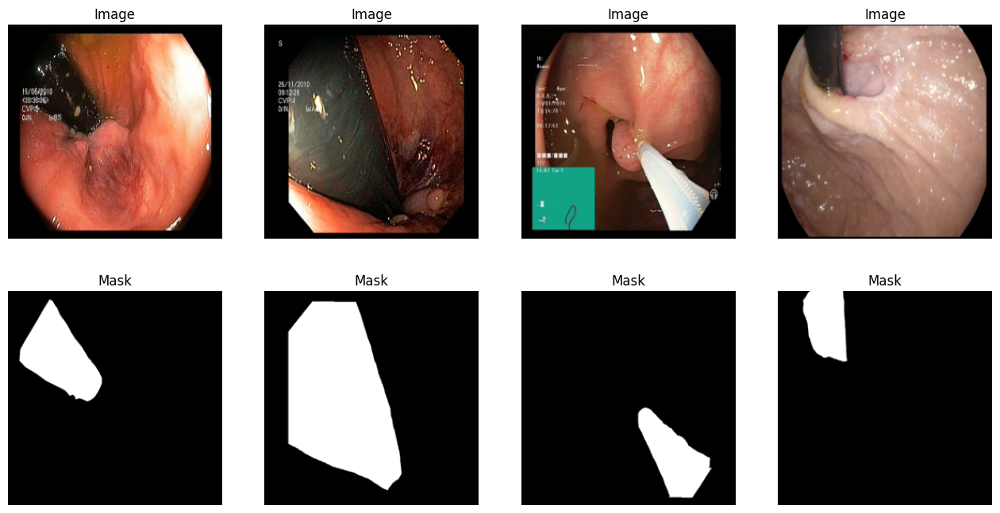

In [10]:
def visualize_images_and_masks(dataloader):
    images, masks = next(iter(dataloader))

    fig, axs = plt.subplots(2, 4, figsize=(16, 8))

    for i in range(4):

        axs[0, i].imshow(images[i].permute(1, 2, 0))
        axs[0, i].set_title("Image")
        axs[0, i].axis('off')

        axs[1, i].imshow(masks[i].squeeze(), cmap='gray')
        axs[1, i].set_title("Mask")
        axs[1, i].axis('off')

    plt.show()

visualize_images_and_masks(dataloader)

In [11]:
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.contracting_path = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),
            nn.Conv2d(1024, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),
        )

        self.expansive_path = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
        )

        self.final_layer = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        x1 = self.contracting_path(x)
        x = self.expansive_path(x1)
        x = self.final_layer(x)
        return x

model = UNet()
input_tensor = torch.randn(1, 3, 256, 256)
output_tensor = model(input_tensor)
print("Output shape:", output_tensor.shape)


Output shape: torch.Size([1, 1, 256, 256])


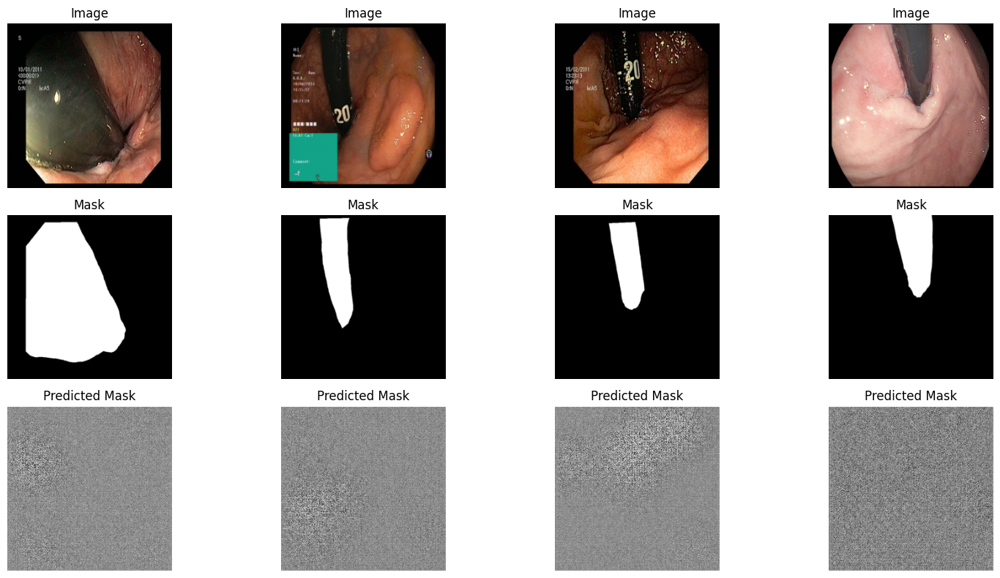

In [12]:
def visualize_images_masks_predictions(model, dataloader):
    images, masks = next(iter(dataloader))

    fig, axs = plt.subplots(3, 4, figsize=(16, 8))

    for i in range(4):
        axs[0, i].imshow(images[i].permute(1, 2, 0))
        axs[0, i].set_title("Image")
        axs[0, i].axis('off')

        axs[1, i].imshow(masks[i].squeeze(), cmap='gray')
        axs[1, i].set_title("Mask")
        axs[1, i].axis('off')

        output = model(images)
        predicted_mask = torch.sigmoid(output[i]).squeeze().detach().cpu().numpy()
        axs[2, i].imshow(predicted_mask, cmap='gray')
        axs[2, i].set_title("Predicted Mask")
        axs[2, i].axis('off')

    plt.tight_layout()
    plt.show()


visualize_images_masks_predictions(model, dataloader)

In [13]:
import torch
from torch.utils.data import DataLoader, SubsetRandomSampler
from torchvision import datasets, transforms

dataset = EndoscopyDataset(csv_file=csv_file_path, transform=transform)

split_ratio = (0.7, 0.1, 0.2)

num_samples = len(dataset)
num_train = int(split_ratio[0] * num_samples)
num_val = int(split_ratio[1] * num_samples)
num_test = num_samples - num_train - num_val

indices = torch.randperm(num_samples)

train_indices = indices[:num_train]
val_indices = indices[num_train:num_train + num_val]
test_indices = indices[num_train + num_val:]

print("Dataframe size:", num_samples)
print("Training Dataframe size:", len(train_indices))
print("Validation Dataframe size:", len(val_indices))
print("Testing Dataframe size:", len(test_indices))

train_sampler = SubsetRandomSampler(train_indices)
val_sampler = SubsetRandomSampler(val_indices)
test_sampler = SubsetRandomSampler(test_indices)

batch_size = 32

training_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
validation_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=val_sampler)
testing_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=test_sampler)


Dataframe size: 590
Training Dataframe size: 413
Validation Dataframe size: 59
Testing Dataframe size: 118


In [14]:
learning_rate = 0.003
model = UNet()
batch_size = 8
num_epochs = 150
parameters = model.parameters()
optimizer = tc.optim.Adam(parameters, lr=learning_rate)
device = "cuda:0"
logger = SummaryWriter(log_dir="/content/logs/UNet", comment="UNet")

def dice_loss(prediction, target):
    smooth = 1
    prediction = prediction.contiguous().view(-1)
    target = target.contiguous().view(-1)
    intersection = tc.sum(prediction * target)
    return 1 - ((2 * intersection + smooth) / (prediction.sum() + target.sum() + smooth))

objective_function = dice_loss

In [15]:
def training(model, training_dataloader, validation_dataloader,
             objective_function, optimizer, num_epochs, logger, device):

    model.to(device)

    print("Training Dataset size:", len(train_indices))
    print("Validation Dataset size:", len(val_indices))

    for epoch in range(num_epochs):
        print(f'Current epoch: {epoch}')

        model.train()

        total_train_loss = 0.0
        num_train_batches = 0

        for images, masks in training_dataloader:
            images = images.to(device)
            masks = masks.to(device)

            optimizer.zero_grad()

            outputs = model(images)

            loss = objective_function(outputs, masks)

            loss.backward()

            optimizer.step()

            total_train_loss += loss.item()
            num_train_batches += 1

        avg_train_loss = total_train_loss / num_train_batches

        logger.add_scalar('Loss/train', avg_train_loss, epoch)

        print(f'Current training epoch loss: {avg_train_loss}')

        model.eval()

        total_val_loss = 0.0
        num_val_batches = 0

        with torch.no_grad():
            for images, masks in validation_dataloader:
                images = images.to(device)
                masks = masks.to(device)

                outputs = model(images)

                val_loss = objective_function(outputs, masks)

                total_val_loss += val_loss.item()
                num_val_batches += 1

        avg_val_loss = total_val_loss / num_val_batches

        logger.add_scalar('Loss/validation', avg_val_loss, epoch)

        print(f'Current validation epoch loss: {avg_val_loss}')


In [16]:
training(model, training_dataloader, validation_dataloader, objective_function, optimizer, num_epochs, logger, device)

Training Dataset size: 413
Validation Dataset size: 59
Current epoch: 0


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Current training epoch loss: 10.139486042352823
Current validation epoch loss: 0.7633780539035797
Current epoch: 1
Current training epoch loss: 0.6897155184012193
Current validation epoch loss: 0.7962451875209808
Current epoch: 2
Current training epoch loss: -0.738683989414802
Current validation epoch loss: 0.7734982967376709
Current epoch: 3
Current training epoch loss: 6.609024286270142
Current validation epoch loss: 0.6566679179668427
Current epoch: 4
Current training epoch loss: 1.644966496871068
Current validation epoch loss: 0.7496628761291504
Current epoch: 5
Current training epoch loss: 0.7633561171018161
Current validation epoch loss: 0.88974329829216
Current epoch: 6
Current training epoch loss: 0.7488485987369831
Current validation epoch loss: 1.0234377980232239
Current epoch: 7
Current training epoch loss: 0.7333628993767959
Current validation epoch loss: 0.7788443267345428
Current epoch: 8
Current training epoch loss: 0.7189747782853934
Current validation epoch loss: 0.187

In [17]:
%load_ext tensorboard
%tensorboard --logdir /content/logs/UNet


<IPython.core.display.Javascript object>

In [31]:
from scipy.ndimage import _ni_support
from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure
from glob import glob

batch_size = 32

# Create dataloaders for each subset
training_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
validation_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=val_sampler)
testing_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=test_sampler)

# Define Dice and HD95 metrics calculation functions
def dc(input1, input2):
    input1 = np.atleast_1d(input1.astype(np.bool))
    input2 = np.atleast_1d(input2.astype(np.bool))
    intersection = np.count_nonzero(input1 & input2)
    size_i1 = np.count_nonzero(input1)
    size_i2 = np.count_nonzero(input2)
    try:
        dice_coefficient = 2. * intersection / float(size_i1 + size_i2)
    except ZeroDivisionError:
        dice_coefficient = 0.0
    return dice_coefficient

def __surface_distances(result, reference, voxelspacing=None, connectivity=1):
    result = np.atleast_1d(result.astype(np.bool))
    reference = np.atleast_1d(reference.astype(np.bool))
    if voxelspacing is not None:
        voxelspacing = _ni_support._normalize_sequence(voxelspacing, result.ndim)
        voxelspacing = np.asarray(voxelspacing, dtype=np.float64)
        if not voxelspacing.flags.contiguous:
            voxelspacing = voxelspacing.copy()
    footprint = generate_binary_structure(result.ndim, connectivity)
    if 0 == np.count_nonzero(result) or 0 == np.count_nonzero(reference):
        return np.array([])
    result_border = result ^ binary_erosion(result, structure=footprint, iterations=1)
    reference_border = reference ^ binary_erosion(reference, structure=footprint, iterations=1)
    dt = distance_transform_edt(~reference_border, sampling=voxelspacing)
    sds = dt[result_border]
    return sds

def hd95(result, reference, voxelspacing=None, connectivity=1):
    hd1 = __surface_distances(result, reference, voxelspacing, connectivity)
    hd2 = __surface_distances(reference, result, voxelspacing, connectivity)
    if hd1.size == 0 or hd2.size == 0:
        return np.inf
    hd95_value = np.percentile(np.hstack((hd1, hd2)), 95)
    return hd95_value

model = UNet().to(device)
model.eval()

def evaluate_model(dataloader, model, device):
    dices = []
    hds95 = []
    with tc.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            predictions = (outputs > 0.5).float()

            predictions_np = predictions.cpu().numpy()
            masks_np = masks.cpu().numpy()

            for pred, mask in zip(predictions_np, masks_np):
                if np.count_nonzero(pred) == 0 or np.count_nonzero(mask) == 0:
                    continue

                try:
                    dice_score = dc(pred, mask)
                    hd95_score = hd95(pred, mask)
                except RuntimeError as e:
                    continue
                dices.append(dice_score)
                hds95.append(hd95_score)

    return dices, hds95

training_dices, training_hds95 = evaluate_model(training_dataloader, model, device)
validation_dices, validation_hds95 = evaluate_model(validation_dataloader, model, device)
testing_dices, testing_hds95 = evaluate_model(testing_dataloader, model, device)

print(f"Training Dice Mean: {np.array(training_dices).mean()}")
print(f"Training Dice Std: {np.array(training_dices).std()}")
print(f"Training Dice Min: {np.array(training_dices).min()}")
print(f"Training Dice Max: {np.array(training_dices).max()}")

print(f"Validation Dice Mean: {np.array(validation_dices).mean()}")
print(f"Validation Dice Std: {np.array(validation_dices).std()}")
print(f"Validation Dice Min: {np.array(validation_dices).min()}")
print(f"Validation Dice Max: {np.array(validation_dices).max()}")

print(f"Testing Dice Mean: {np.array(testing_dices).mean()}")
print(f"Testing Dice Std: {np.array(testing_dices).std()}")
print(f"Testing Dice Min: {np.array(testing_dices).min()}")
print(f"Testing Dice Max: {np.array(testing_dices).max()}")

print()

print(f"Training HD95 Mean: {np.array(training_hds95).mean()}")
print(f"Training HD95 Std: {np.array(training_hds95).std()}")
print(f"Training HD95 Min: {np.array(training_hds95).min()}")
print(f"Training HD95 Max: {np.array(training_hds95).max()}")

print(f"Validation HD95 Mean: {np.array(validation_hds95).mean()}")
print(f"Validation HD95 Std: {np.array(validation_hds95).std()}")
print(f"Validation HD95 Min: {np.array(validation_hds95).min()}")
print(f"Validation HD95 Max: {np.array(validation_hds95).max()}")

print(f"Testing HD95 Mean: {np.array(testing_hds95).mean()}")
print(f"Testing HD95 Std: {np.array(testing_hds95).std()}")
print(f"Testing HD95 Min: {np.array(testing_hds95).min()}")
print(f"Testing HD95 Max: {np.array(testing_hds95).max()}")


<ipython-input-31-b748b80ef36b>:2: DeprecationWarning: Please use `distance_transform_edt` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure
<ipython-input-31-b748b80ef36b>:2: DeprecationWarning: Please use `binary_erosion` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure
<ipython-input-31-b748b80ef36b>:2: DeprecationWarning: Please use `generate_binary_structure` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure


Training Dice Mean: nan
Training Dice Std: nan


<ipython-input-31-b748b80ef36b>:96: RuntimeWarning: Mean of empty slice.
  print(f"Training Dice Mean: {np.array(training_dices).mean()}")


ValueError: zero-size array to reduction operation minimum which has no identity